Number of images loaded: 50000


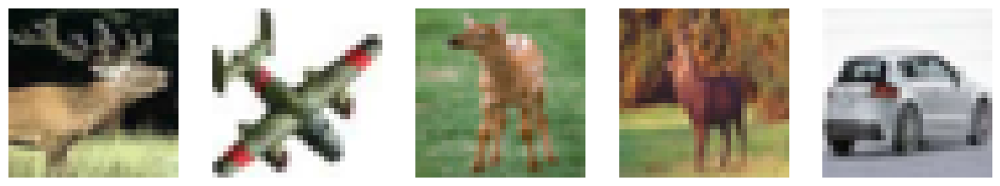

In [23]:
import zipfile
import numpy as np
from PIL import Image
import io
import cv2
import matplotlib.pyplot as plt



# Function to load images from a zip file

def load_images_from_zip(zip_path):

    images = []

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:

        for file_info in zip_ref.infolist():

            if file_info.filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if the file has a valid image extension

                with zip_ref.open(file_info) as file:

                    try:

                        img_data = io.BytesIO(file.read())

                        img = Image.open(img_data)

                        images.append(np.array(img))

                    except Exception as e:

                        print(f"Error loading image {file_info.filename}: {e}")

    return np.array(images)

 

 

# Function to resize images

def resize_images(images, new_size):

    resized_images = []

    for img in images:

        resized_img = Image.fromarray(img).resize(new_size)

        resized_images.append(np.array(resized_img))

    return np.array(resized_images)

 

# Function to convert images to grayscale

def convert_to_grayscale(images):

    grayscale_images = []

    for img in images:

        grayscale_img = Image.fromarray(img).convert('L')

        grayscale_images.append(np.array(grayscale_img))

    return np.array(grayscale_images)

 

# Load images from the zip file

zip_path = 'Dataset.zip'

images = load_images_from_zip(zip_path)

 

# Resize images to a uniform size (e.g., 64x64)

new_size = (64, 64)

resized_images = resize_images(images, new_size)

 

# Convert images to grayscale if necessary

# grayscale_images = convert_to_grayscale(resized_images)

 

# Now you have pre-processed images ready for further processing or feature extraction

 # Load images from the zip file

zip_path = 'Dataset.zip'

images = load_images_from_zip(zip_path)

 

# Check the length of the loaded images array

print(f"Number of images loaded: {len(images)}") 

# Visualize a few loaded images

import matplotlib.pyplot as plt

# Function to display images

def display_images(images, num_images=5):

    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))

    for i in range(num_images):

        ax = axes[i]

        ax.imshow(images[np.random.randint(len(images))])

        ax.axis('off')

    plt.show()
#Display a few random images

display_images(images)

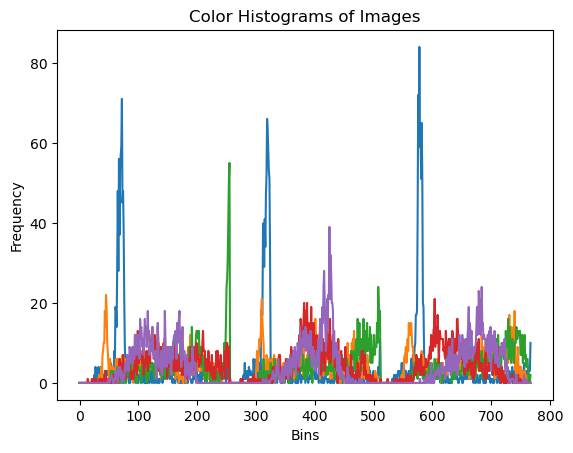

In [24]:
# Function to compute color histograms for images
def compute_color_histograms(images):
    histograms = []
    for img in images:
        # Convert image to RGB (OpenCV uses BGR by default)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Compute histogram for each color channel (R, G, B)
        hist_r = cv2.calcHist([img_rgb], [0], None, [256], [0, 256])
        hist_g = cv2.calcHist([img_rgb], [1], None, [256], [0, 256])
        hist_b = cv2.calcHist([img_rgb], [2], None, [256], [0, 256])
        # Concatenate histograms for all channels
        hist = np.concatenate((hist_r, hist_g, hist_b), axis=None)
        histograms.append(hist)
    return np.array(histograms)

# Compute color histograms for the loaded images
histograms = compute_color_histograms(images)

# Visualize a few histograms
num_histograms_to_visualize = 5
for i in range(num_histograms_to_visualize):
    plt.plot(histograms[i])
plt.title('Color Histograms of Images')
plt.xlabel('Bins')
plt.ylabel('Frequency')
plt.show()

In [25]:
from datasketch import MinHash, MinHashLSH

# Function to generate MinHash signatures for feature vectors
def generate_minhash_signatures(feature_vectors, num_perm):
    minhashes = []
    for feature_vector in feature_vectors:
        minhash = MinHash(num_perm=num_perm)
        for value in feature_vector:
            minhash.update(str(value).encode('utf-8'))  # Update MinHash with each value in feature vector
        minhashes.append(minhash)
    return minhashes


# Generate MinHash signatures for feature vectors
num_perm = 128  # Adjust based on your dataset and requirements
minhashes = generate_minhash_signatures(histograms, num_perm)
print(minhashes)

[<datasketch.minhash.MinHash object at 0x000002CEC41C77D0>, <datasketch.minhash.MinHash object at 0x000002CED3FE3E90>, <datasketch.minhash.MinHash object at 0x000002CED3FEB190>, <datasketch.minhash.MinHash object at 0x000002CED3FEAE10>, <datasketch.minhash.MinHash object at 0x000002CED3FE8510>, <datasketch.minhash.MinHash object at 0x000002CECEECC990>, <datasketch.minhash.MinHash object at 0x000002CECEECD510>, <datasketch.minhash.MinHash object at 0x000002CECEECD4D0>, <datasketch.minhash.MinHash object at 0x000002CEC41C0B50>, <datasketch.minhash.MinHash object at 0x000002CEF3E80810>, <datasketch.minhash.MinHash object at 0x000002CEC41C1B90>, <datasketch.minhash.MinHash object at 0x000002CED09210D0>, <datasketch.minhash.MinHash object at 0x000002CED09212D0>, <datasketch.minhash.MinHash object at 0x000002CED5AA3D90>, <datasketch.minhash.MinHash object at 0x000002CED5AA3890>, <datasketch.minhash.MinHash object at 0x000002CED5AA3050>, <datasketch.minhash.MinHash object at 0x000002CED5AA0F1

In [26]:
# Function to initialize LSH with MinHash signatures
def initialize_lsh(minhashes, num_tables, threshold):
    lsh = MinHashLSH(threshold=threshold, num_perm=minhashes[0].num_perm)
    for i, minhash in enumerate(minhashes):
        lsh.insert(f'item_{i}', minhash)
    return lsh



# Initialize LSH with MinHash signatures
num_tables = 10  # Adjust based on your dataset and requirements
threshold = 0.5  # Adjust based on your dataset and requirements
lsh = initialize_lsh(minhashes, num_tables, threshold)
print(lsh)

In [28]:
import random

# Convert color_histograms to a list if it's not already in a sequence format
color_histograms_list = list(histograms)

# Define the size of the subset (number of test queries)
subset_size = 100

# Create a subset of feature vectors as test queries
test_queries = random.sample(color_histograms_list, subset_size)

In [31]:
# Generate MinHash signatures for the test queries (assuming 'test_queries' contains the test query feature vectors)
test_query_minhashes = generate_minhash_signatures(test_queries, num_perm)

# Execute queries against the LSH hash tables
similar_items = []
for minhash in test_query_minhashes:
    query_results = lsh.query(minhash)
    similar_items.append(query_results)

# Analyze the results of the queries
for i, query_result in enumerate(similar_items):
    print(f"Similar items for query {i + 1}: Found {len(query_result)} candidates")


Similar items for query 1: Found 19040 candidates
Similar items for query 2: Found 23655 candidates
Similar items for query 3: Found 45873 candidates
Similar items for query 4: Found 20797 candidates
Similar items for query 5: Found 45878 candidates
Similar items for query 6: Found 45978 candidates
Similar items for query 7: Found 46385 candidates
Similar items for query 8: Found 46348 candidates
Similar items for query 9: Found 45532 candidates
Similar items for query 10: Found 44916 candidates
Similar items for query 11: Found 46520 candidates
Similar items for query 12: Found 46072 candidates
Similar items for query 13: Found 45875 candidates
Similar items for query 14: Found 42257 candidates
Similar items for query 15: Found 46357 candidates
Similar items for query 16: Found 44554 candidates
Similar items for query 17: Found 45012 candidates
Similar items for query 18: Found 45338 candidates
Similar items for query 19: Found 45111 candidates
Similar items for query 20: Found 46124 

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances

# Function to compute Euclidean distance between two feature vectors
def compute_euclidean_distance(query_vector, result_vector):
    return euclidean_distances(query_vector.reshape(1, -1), result_vector.reshape(1, -1))

# Iterate over the retrieval results and compute Euclidean distance for comparison
# Analyze the results of the queries
for i, query_result in enumerate(similar_items):
    print(f"Query {i + 1}:")
    for result_item in query_result:
        result_index = int(result_item.split('_')[1])  # Extract index from the identifier
        result_vector = color_histograms_list[result_index]  # Feature vector of the retrieved item
        euclidean_dist = compute_euclidean_distance(query_vector, result_vector)
        print(f"  Result Item: {result_item}, Euclidean Distance: {euclidean_dist}")



Query 1:
  Result Item: item_25622, Euclidean Distance: [[323.81784]]
  Result Item: item_1224, Euclidean Distance: [[296.50632]]
  Result Item: item_22525, Euclidean Distance: [[277.36978]]
  Result Item: item_41905, Euclidean Distance: [[266.80704]]
  Result Item: item_41604, Euclidean Distance: [[294.4011]]
  Result Item: item_3620, Euclidean Distance: [[280.54947]]
  Result Item: item_5033, Euclidean Distance: [[294.9983]]
  Result Item: item_15847, Euclidean Distance: [[302.79367]]
  Result Item: item_35862, Euclidean Distance: [[277.4491]]
  Result Item: item_18762, Euclidean Distance: [[264.45416]]
  Result Item: item_24144, Euclidean Distance: [[301.0714]]
  Result Item: item_5476, Euclidean Distance: [[266.8183]]
  Result Item: item_33149, Euclidean Distance: [[278.74362]]
  Result Item: item_40417, Euclidean Distance: [[337.7129]]
  Result Item: item_49243, Euclidean Distance: [[270.21844]]
  Result Item: item_1238, Euclidean Distance: [[306.93323]]
  Result Item: item_43579,